In [2]:
import os
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import tensorflow as tf
from PIL import Image

In [3]:
# Path to the dataset directory
dataset_dir = 'CUB_200_2011/'

In [4]:
# Load class names from classes.txt file
class_names_df = pd.read_csv(os.path.join(dataset_dir, 'classes.txt'), sep=' ', header=None, names=['class_id', 'class_name'])
class_names_df['class_id'] = class_names_df['class_id'].astype(str)

In [5]:
print(class_names_df.head())

  class_id                  class_name
0        1  001.Black_footed_Albatross
1        2        002.Laysan_Albatross
2        3         003.Sooty_Albatross
3        4       004.Groove_billed_Ani
4        5          005.Crested_Auklet


In [6]:
# Load image filenames and class labels from image_class_labels.txt
image_class_labels = pd.read_csv(os.path.join(dataset_dir, 'image_class_labels.txt'), sep=' ', header=None, names=['image_id', 'class_id'])
image_class_labels['class_id'] = image_class_labels['class_id'].astype(str)

In [7]:
print(image_class_labels.head())

   image_id class_id
0         1        1
1         2        1
2         3        1
3         4        1
4         5        1


In [8]:
# Load image filenames from images.txt file
images_df = pd.read_csv(os.path.join(dataset_dir, 'images.txt'), sep=' ', header=None, names=['image_id', 'filename'])

In [9]:
print(images_df.head())

   image_id                                           filename
0         1  001.Black_footed_Albatross/Black_Footed_Albatr...
1         2  001.Black_footed_Albatross/Black_Footed_Albatr...
2         3  001.Black_footed_Albatross/Black_Footed_Albatr...
3         4  001.Black_footed_Albatross/Black_Footed_Albatr...
4         5  001.Black_footed_Albatross/Black_Footed_Albatr...


In [10]:
# Merge image filenames with class labels
image_data = pd.merge(images_df, image_class_labels, on='image_id')
print(image_data.head())

   image_id                                           filename class_id
0         1  001.Black_footed_Albatross/Black_Footed_Albatr...        1
1         2  001.Black_footed_Albatross/Black_Footed_Albatr...        1
2         3  001.Black_footed_Albatross/Black_Footed_Albatr...        1
3         4  001.Black_footed_Albatross/Black_Footed_Albatr...        1
4         5  001.Black_footed_Albatross/Black_Footed_Albatr...        1


In [11]:
# Merge with class names to get class names for each image
image_data = pd.merge(image_data, class_names_df, on='class_id')
print(image_data.head())

   image_id                                           filename class_id  \
0         1  001.Black_footed_Albatross/Black_Footed_Albatr...        1   
1         2  001.Black_footed_Albatross/Black_Footed_Albatr...        1   
2         3  001.Black_footed_Albatross/Black_Footed_Albatr...        1   
3         4  001.Black_footed_Albatross/Black_Footed_Albatr...        1   
4         5  001.Black_footed_Albatross/Black_Footed_Albatr...        1   

                   class_name  
0  001.Black_footed_Albatross  
1  001.Black_footed_Albatross  
2  001.Black_footed_Albatross  
3  001.Black_footed_Albatross  
4  001.Black_footed_Albatross  


In [12]:
import pandas as pd

# Read the bounding boxes data
bounding_boxes_df = pd.read_csv(os.path.join(dataset_dir, 'bounding_boxes.txt'), sep=' ', header=None, names=['image_id', 'x', 'y', 'width', 'height'])

# Merge image_data with bounding_boxes_df on image_id
image_data = pd.merge(image_data, bounding_boxes_df, on='image_id')

In [13]:
print(image_data.head())

   image_id                                           filename class_id  \
0         1  001.Black_footed_Albatross/Black_Footed_Albatr...        1   
1         2  001.Black_footed_Albatross/Black_Footed_Albatr...        1   
2         3  001.Black_footed_Albatross/Black_Footed_Albatr...        1   
3         4  001.Black_footed_Albatross/Black_Footed_Albatr...        1   
4         5  001.Black_footed_Albatross/Black_Footed_Albatr...        1   

                   class_name      x      y  width  height  
0  001.Black_footed_Albatross   60.0   27.0  325.0   304.0  
1  001.Black_footed_Albatross  139.0   30.0  153.0   264.0  
2  001.Black_footed_Albatross   14.0  112.0  388.0   186.0  
3  001.Black_footed_Albatross  112.0   90.0  255.0   242.0  
4  001.Black_footed_Albatross   70.0   50.0  134.0   303.0  


In [14]:
# Split data into training and test sets
train_data, test_data = train_test_split(image_data, test_size=0.2, random_state=42)

In [15]:
train_data.head()

,image_id,filename,class_id,class_name,x,y,width,height
8410,8411,144.Common_Tern/Common_Tern_0043_147753.jpg,144,144.Common_Tern,176.0,119.0,253.0,161.0
5064,5065,087.Mallard/Mallard_0095_76080.jpg,87,087.Mallard,46.0,34.0,430.0,258.0
3844,3845,067.Anna_Hummingbird/Anna_Hummingbird_0098_563...,67,067.Anna_Hummingbird,164.0,82.0,232.0,244.0
10071,10072,172.Nashville_Warbler/Nashville_Warbler_0103_1...,172,172.Nashville_Warbler,69.0,152.0,161.0,248.0
4392,4393,076.Dark_eyed_Junco/Dark_Eyed_Junco_0058_68784...,76,076.Dark_eyed_Junco,77.0,34.0,381.0,284.0


In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import cv2
from PIL import Image

# Loop over all images in the train_data
for i in range(len(train_data)):
    # Get the filename and label
    filename = train_data.iloc[i,1]  # Assuming that the filename is the first element
    label = train_data.iloc[i, 2]  # Assuming that the label is the second element
    label_class = np.argmax(label)

    # Load the image from the file
    image_path = 'CUB_200_2011/Images/' + filename
    image = np.array(Image.open(image_path))

    # Get the corresponding row from image_data
    row = train_data.iloc[i]

    # Calculate bounding box coordinates
    xmin = int(row['x'])
    ymin = int(row['y'])
    xmax = int(xmin + row['width'])
    ymax = int(ymin + row['height'])

    # Draw the bounding box on the image
    image_bgr = cv2.cvtColor(image, cv2.COLOR_RGB2BGR)
    cv2.rectangle(image_bgr, (xmin, ymin), (xmax, ymax), (0, 255, 0), 2)
    image_with_box = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)

    # Print the image with bounding box
    plt.imshow(image_with_box)
    plt.title(label_class)
    plt.show()
    # TODO: this is where i stopped, i got the bounding boxes lining up now i just have to crop them then resize them

In [17]:
# Create ImageDataGenerator for preprocessing
datagen = ImageDataGenerator(rescale=1./255)

# Load and preprocess images for training dataset
train_generator = datagen.flow_from_dataframe(
    dataframe=train_data,
    directory=os.path.join(dataset_dir, 'images'),
    x_col='filename',
    y_col='class_name',
    target_size=(299, 299),  # Adjust size as needed
    batch_size=32,
    class_mode='categorical',
    shuffle=True,
    seed=42
)

# Load and preprocess images for test dataset
test_generator = datagen.flow_from_dataframe(
    dataframe=test_data,
    directory=os.path.join(dataset_dir, 'images'),
    x_col='filename',
    y_col='class_name',
    target_size=(299, 299),  # Adjust size as needed
    batch_size=32,
    class_mode='categorical',
    shuffle=False
)

Found 9430 validated image filenames belonging to 200 classes.
Found 2358 validated image filenames belonging to 200 classes.


In [18]:
# Get the first batch of data
images_batch, labels_batch = next(train_generator)

# Print the shapes of the image and label batches
print("Images batch shape:", images_batch.shape)
print("Labels batch shape:", labels_batch.shape)

Images batch shape: (32, 256, 256, 3)
Labels batch shape: (32, 200)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


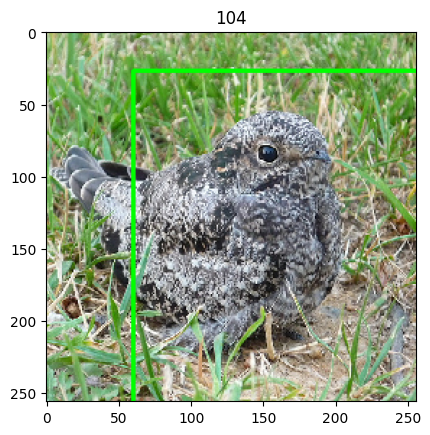

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


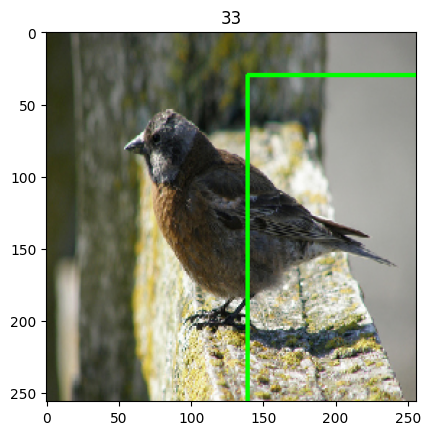

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


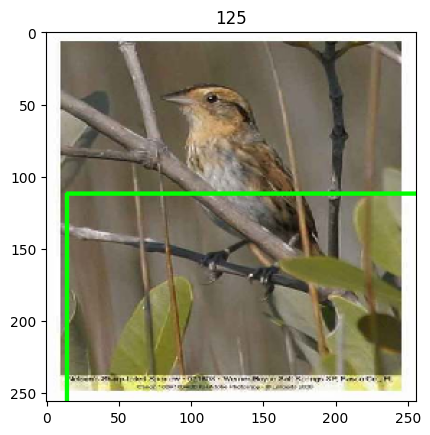

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


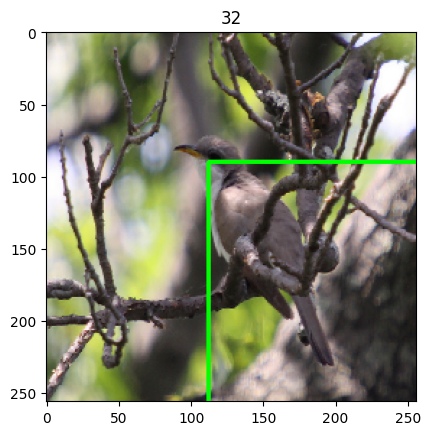

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


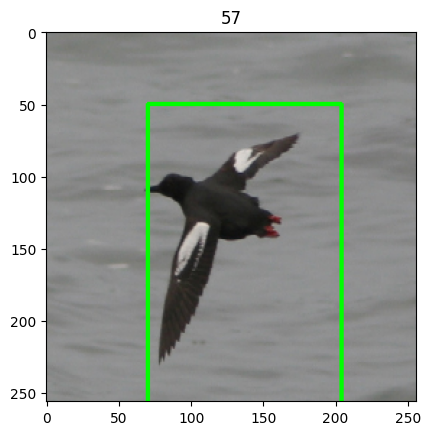

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


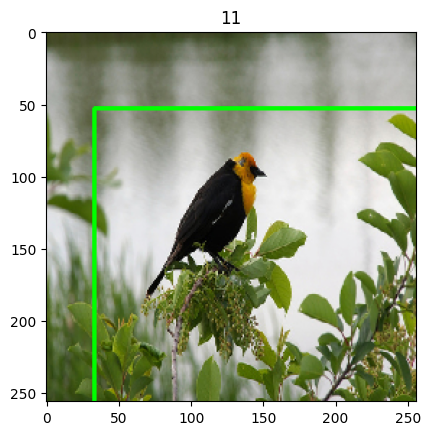

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


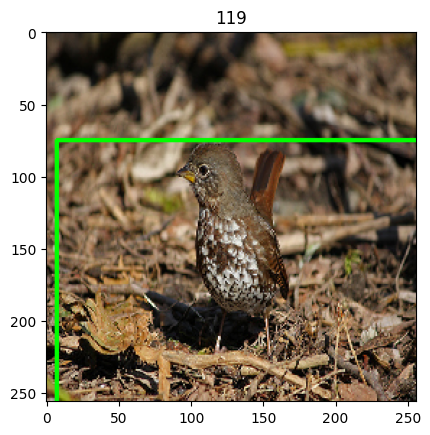

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


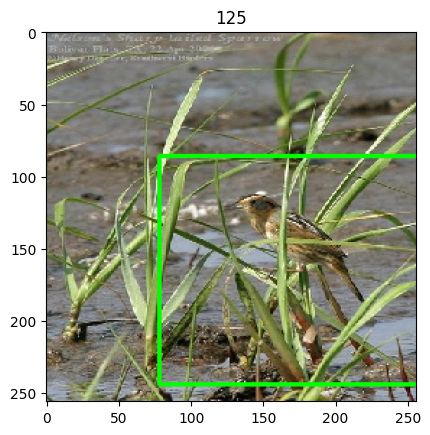

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


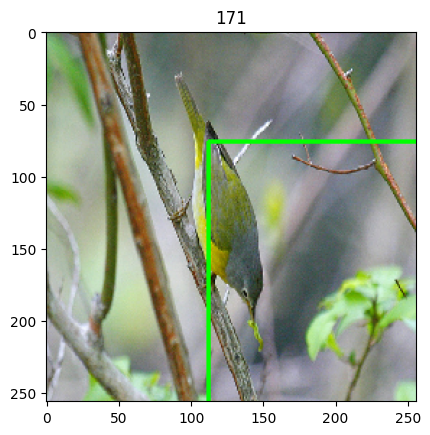

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


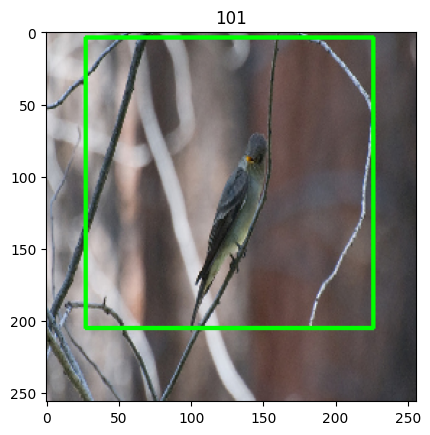

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


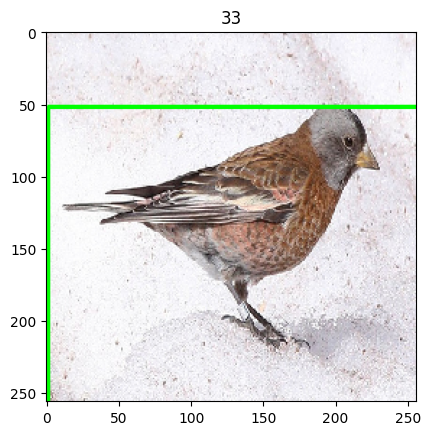

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


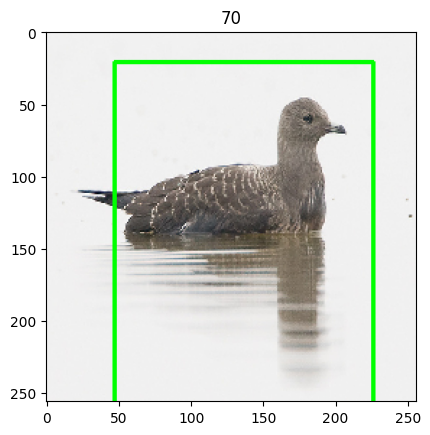

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


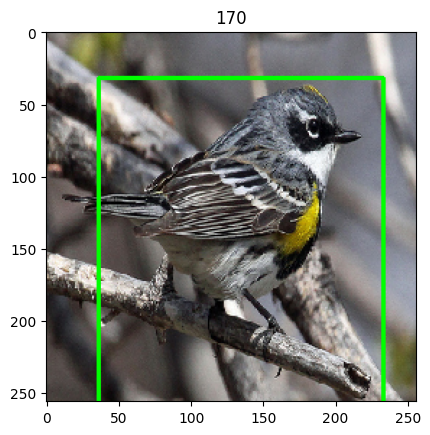

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


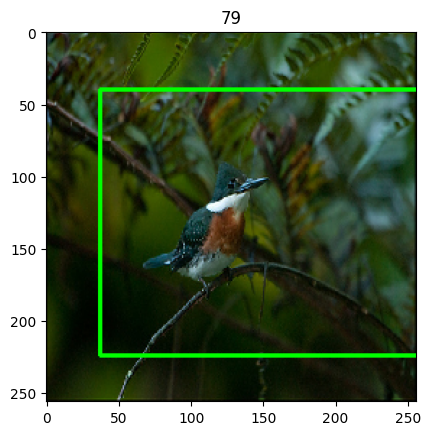

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


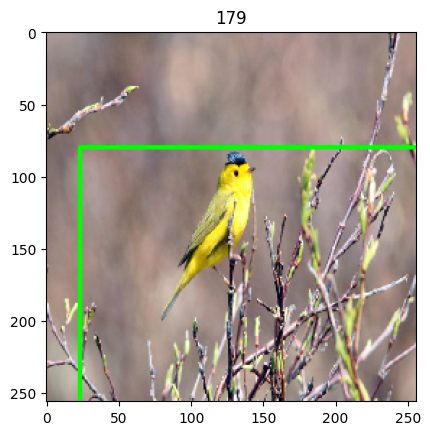

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


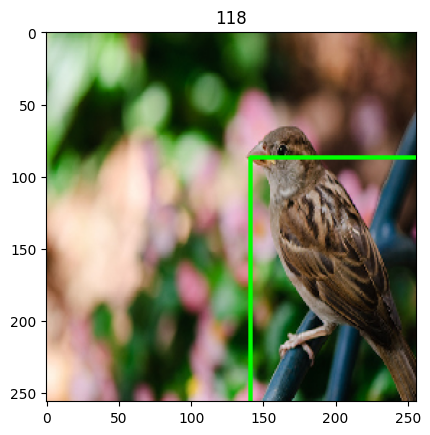

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


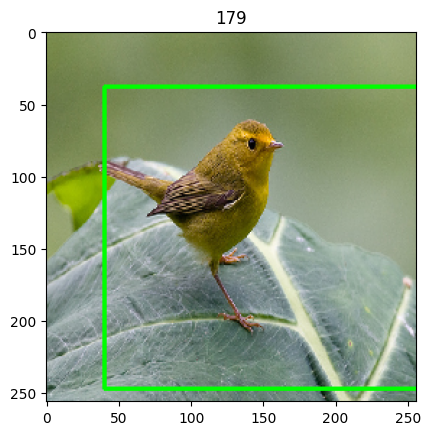

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


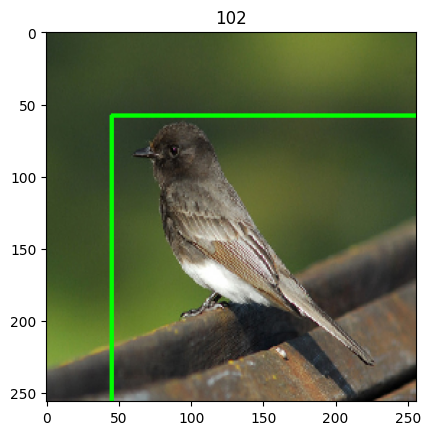

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


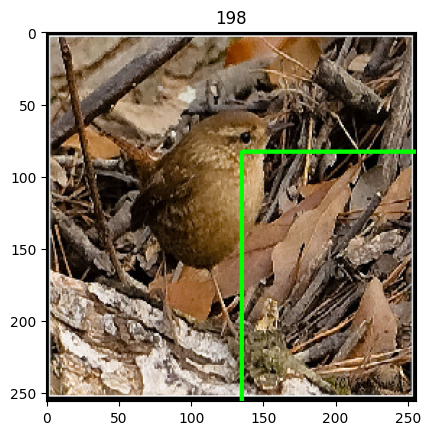

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


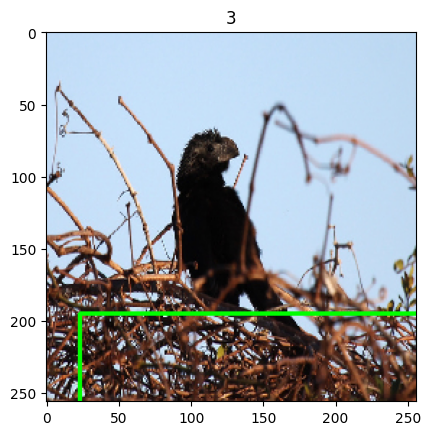

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


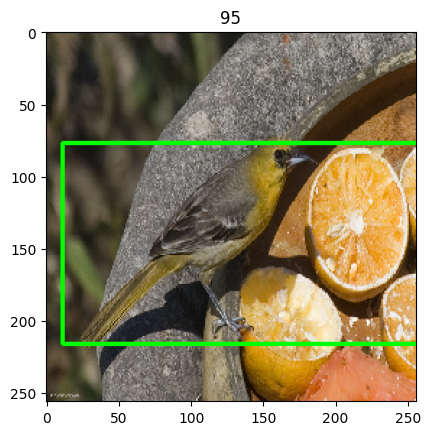

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


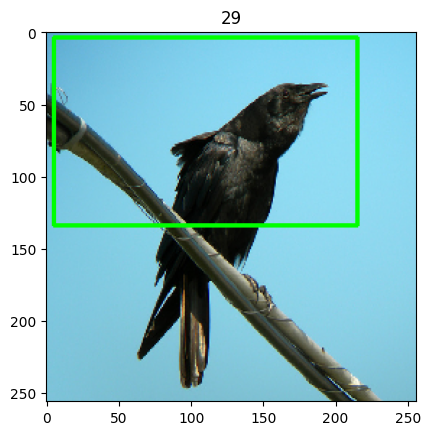

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


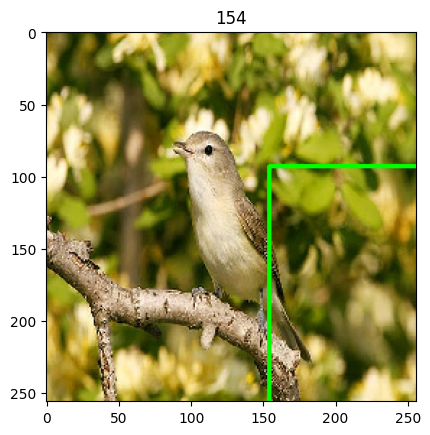

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


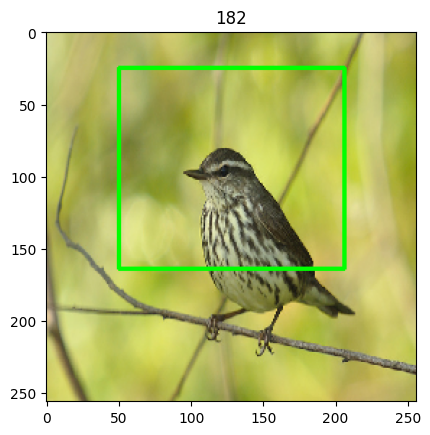

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


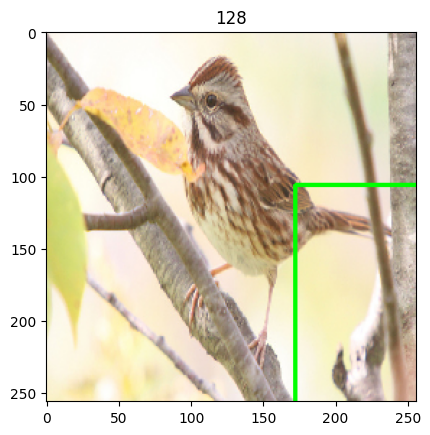

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


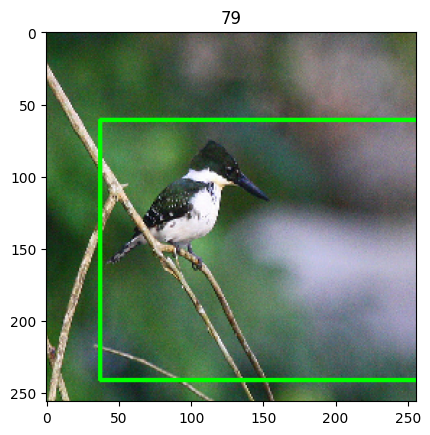

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


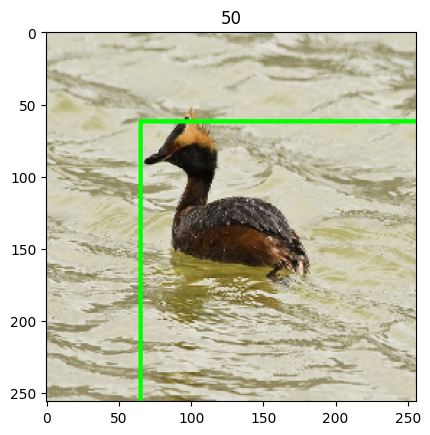

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


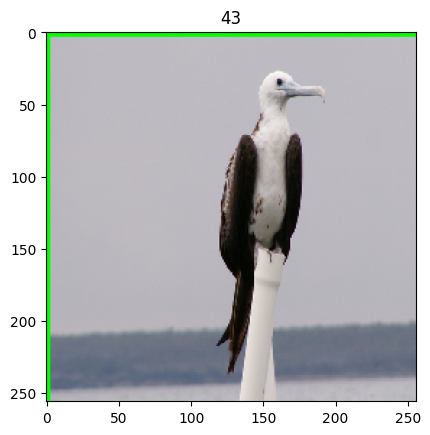

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


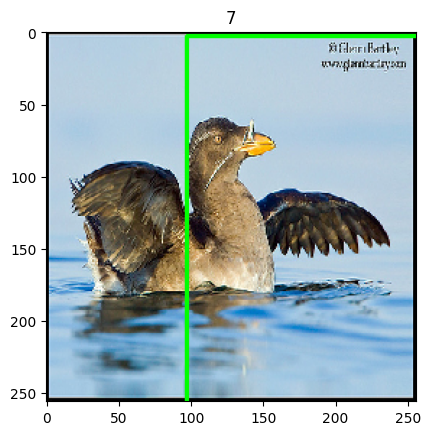

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


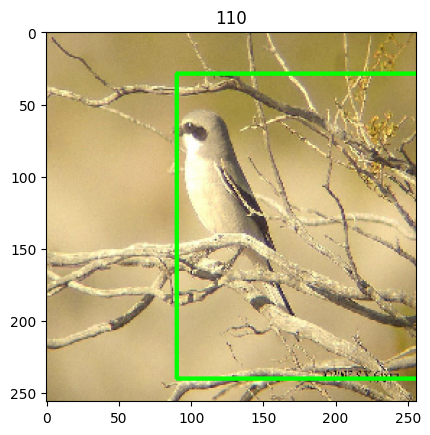

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


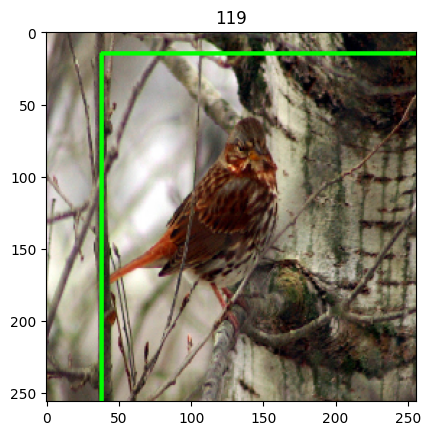

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


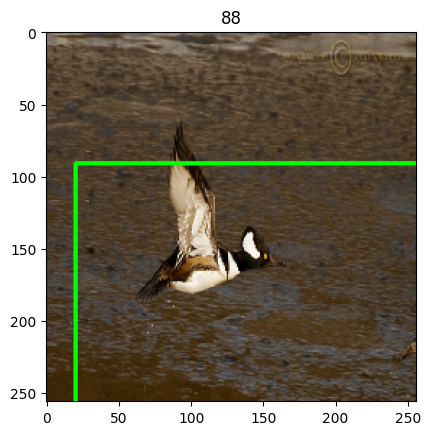

In [19]:
import matplotlib.pyplot as plt
import numpy as np
import cv2

## Loop over all images in the batch
for i in range(len(images_batch)):
    # Get the image and label
    image = images_batch[i]
    label = labels_batch[i]
    label_class = np.argmax(label)

    # Get the corresponding row from image_data
    row = image_data.iloc[i]

    # Calculate bounding box coordinates
    xmin = int(row['x'])
    ymin = int(row['y'])
    xmax = int(xmin + row['width'])
    ymax = int(ymin + row['height'])

    # Draw the bounding box on the image
    image_bgr = cv2.cvtColor(image, cv2.COLOR_RGB2BGR)
    cv2.rectangle(image_bgr, (xmin, ymin), (xmax, ymax), (0, 255, 0), 2)
    image_with_box = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)

    # Print the image with bounding box
    plt.imshow(image_with_box)
    plt.title(label_class)
    plt.show()

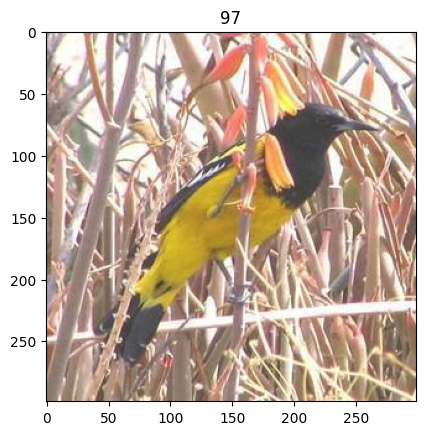

In [48]:
import matplotlib.pyplot as plt
import numpy as np

# Get the first batch of data
images_batch, labels_batch = next(train_generator)

# Get the first label
first_label = labels_batch[0]
# Get the class of the first label
first_label_class = np.argmax(first_label)

# Get the first image
first_image = images_batch[0]

# Print the first image
plt.imshow(first_image)
plt.title(first_label_class)
plt.show()

In [49]:
# get variables for training and validation steps
steps_per_epoch = train_generator.samples // train_generator.batch_size
validation_steps = test_generator.samples // test_generator.batch_size

test_steps = test_generator.samples // test_generator.batch_size

# Number of classes
num_classes = len(class_names_df)

# Number of training and test samples
num_train_samples = len(train_data)
num_test_samples = len(test_data)

In [50]:
# Create datasets
train_dataset = tf.data.Dataset.from_generator(
    lambda: train_generator,
    output_types=(tf.float32, tf.float32),
    output_shapes=([None, 299, 299, 3], [None, num_classes])
)

test_dataset = tf.data.Dataset.from_generator(
    lambda: test_generator,
    output_types=(tf.float32, tf.float32),
    output_shapes=([None, 299, 299, 3], [None, num_classes])
)

# Optionally, prefetch and cache datasets for better performance
# train_dataset = train_dataset.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)
# test_dataset = test_dataset.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)


2024-05-15 04:28:10.831757: I metal_plugin/src/device/metal_device.cc:1154] Metal device set to: Apple M1 Pro
2024-05-15 04:28:10.834443: I metal_plugin/src/device/metal_device.cc:296] systemMemory: 16.00 GB
2024-05-15 04:28:10.843932: I metal_plugin/src/device/metal_device.cc:313] maxCacheSize: 5.33 GB
2024-05-15 04:28:10.844841: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:305] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2024-05-15 04:28:10.849509: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:271] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 0 MB memory) -> physical PluggableDevice (device: 0, name: METAL, pci bus id: <undefined>)


2024-05-15 04:31:35.608993: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


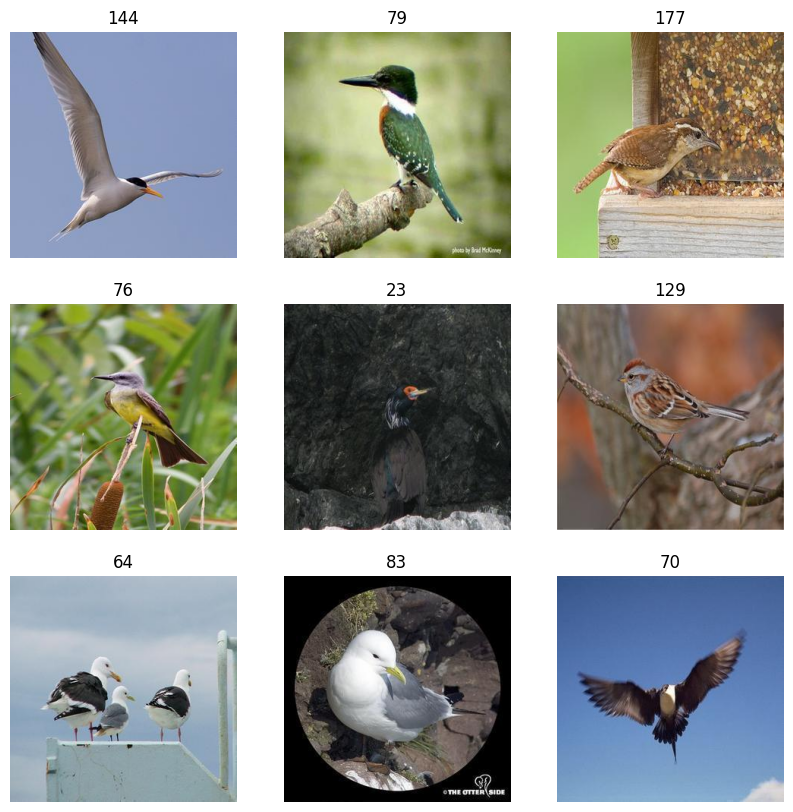

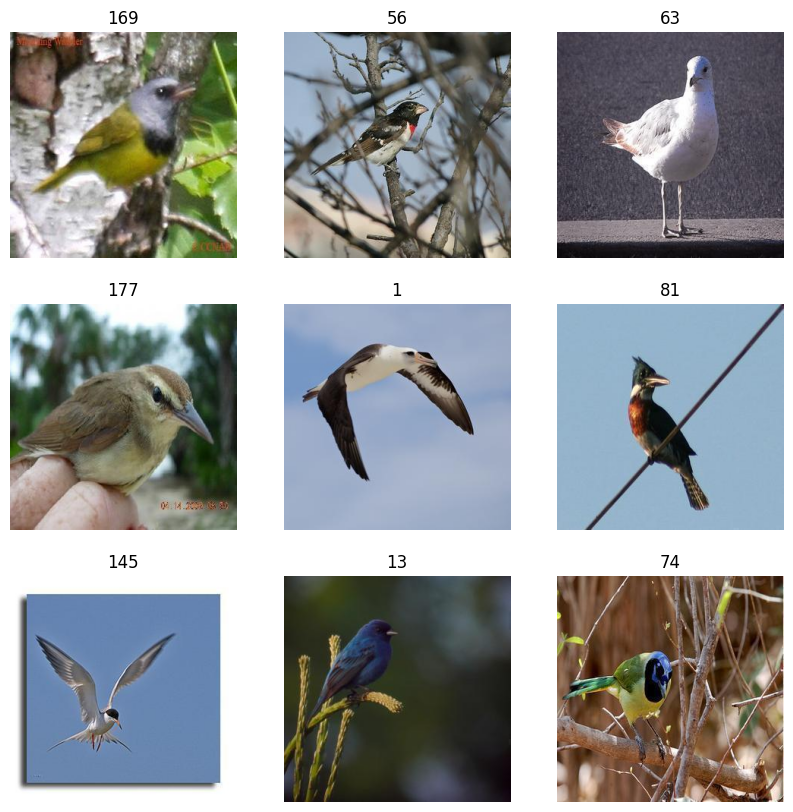

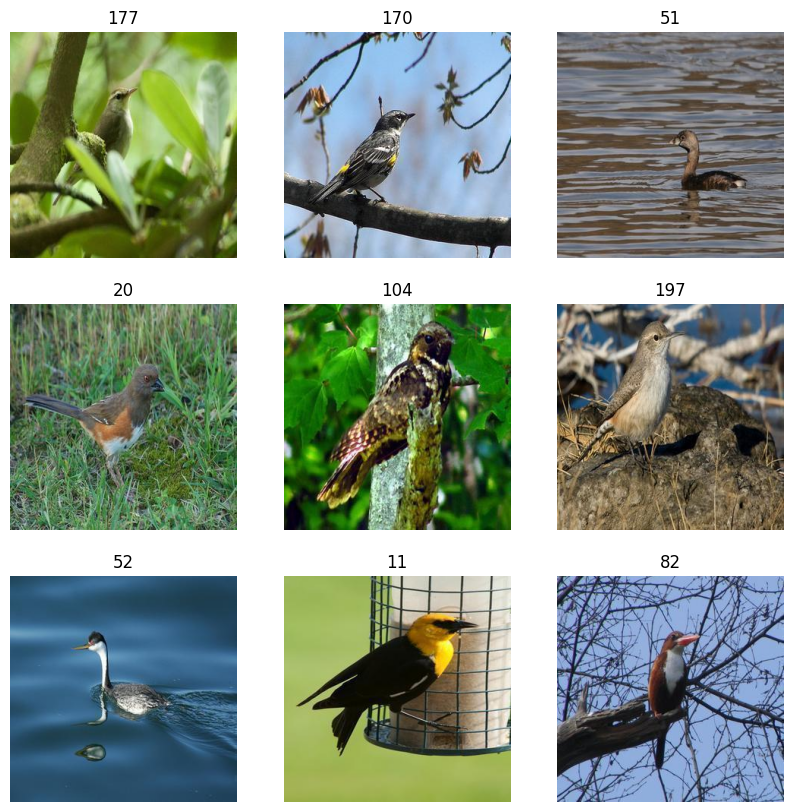

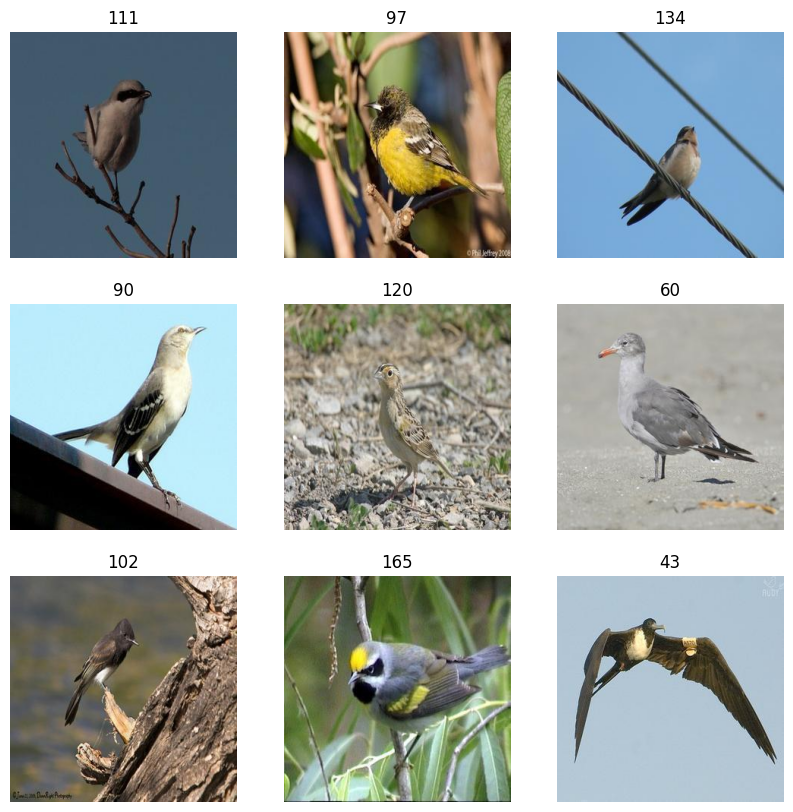

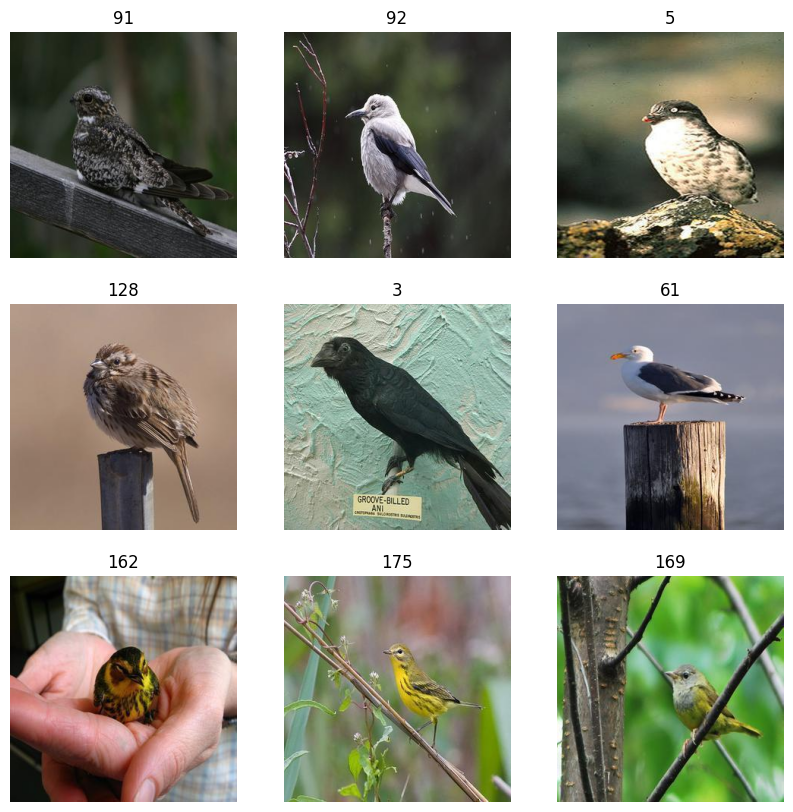

In [56]:
import matplotlib.pyplot as plt

for images, labels in train_dataset.take(5):  # Only take first 5 elements for example
    plt.figure(figsize=(10, 10))
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy())
        plt.title(np.argmax(labels[i]))        
        plt.axis("off")